# SVM и его ядра
__Суммарное количество баллов: 9__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ML][MS][HW07] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

В этом задании нам предстоит решить задачу SVM при помощи `cvxopt` и применить ее к искуственным данным. Затем аналогичным способом нужно будет решить задачу ядерного SVM и исследовать его поведение для различных ядер и значений их параметров.

In [2]:
import numpy as np
import copy
from cvxopt import spmatrix, matrix, solvers
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification, make_moons, make_blobs
from typing import NoReturn, Callable

solvers.options['show_progress'] = False

In [1]:
def visualize(clf, X, y):
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200
    
    cm = plt.cm.Spectral

    xx, yy = np.meshgrid(np.arange(x_min - x_border, x_max + x_border, x_h), np.arange(y_min - y_border, y_max + y_border, y_h))
    mesh = np.c_[xx.ravel(), yy.ravel()]
    z_class = clf.predict(mesh).reshape(xx.shape)

    # Put the result into a color plot
    plt.figure(1, figsize=(8, 8))
    plt.pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading='gouraud')

    # Plot hyperplane and margin
    z_dist = clf.decision_function(mesh).reshape(xx.shape)
    plt.contour(xx, yy, z_dist, [0.0], colors='black')
    plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors='black', linestyles='dashed')

    # # Plot also the training points
    y_pred = clf.predict(X)

    ind_support = []
    ind_correct = []
    ind_incorrect = []
    for i in range(len(y)):
        if i in clf.support:
            ind_support.append(i)
        elif y[i] == y_pred[i]:
            ind_correct.append(i)
        else:
            ind_incorrect.append(i)

    plt.scatter(X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], cmap=cm, alpha=1., edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_incorrect, 0], X[ind_incorrect, 1], c=y[ind_incorrect], cmap=cm, alpha=1., marker='*',
               s=50, edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_support, 0], X[ind_support, 1], c=y[ind_support], cmap=cm, alpha=1., edgecolor='yellow', linewidths=1.,
               s=40)

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.tight_layout()

In [3]:
def generate_dataset(moons=False):
    if moons:
        X, y = make_moons(1000, noise=0.075, random_state=42)
        return X, 2 * y - 1
    X, y = make_blobs(1000, 2, centers=[[0, 0], [-4, 2], [3.5, -2.0], [3.5, 3.5]], random_state=42)
    y = 2 * (y % 2) - 1
    return X, y

X, y = generate_dataset(True)

### Задание 1 (2 балла)
Для начала реализуем обычный линейный SVM. 

#### Методы
`fit(X, y)` - обучает SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Поля
`support` - индексы опорных элементов

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

А наша задача формулируется так:

$\begin{cases}0.5 \cdot w^\text{T}w + C \cdot \sum \xi_i \rightarrow \min_{w, \xi} \\ \xi \geq 0 \\ y_i (w^\text{T}x_i + w_0) \geq 1 - \xi_i \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = (w, w_0, \xi) \\ P = 
\left[
    \begin{array}{c|c}
      I & 0\\
      \hline
      0 & 0
    \end{array}
\right] \\ 
q = \left[
    \begin{array}{c}
      0 \\
      \hline
      C 
    \end{array}
\right] \\ 
 G = 
\left[
    \begin{array}{c|c|c}
      0 & 0 & -I\\
      \hline
      -yX & -y & -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      0 \\
      \hline
      -1 
    \end{array}
\right] $

In [4]:
class LinearSVM:
    def __init__(self, C: float):
        """
        
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        
        """
        self.C = C
        self.support = None

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : np.ndarray
            Данные для обучения SVM.
        y : np.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        self.y = y
        self.x = np.zeros(X.shape[1] + 1 + X.shape[0])
        I = np.eye(X.shape[1])
        block1 = np.zeros([X.shape[1], self.x.shape[0] - X.shape[1]])
        block2 = np.zeros([self.x.shape[0] - X.shape[1], self.x.shape[0]])
        self.P = np.concatenate(
            (np.concatenate((I, block1), axis=1), block2), axis=0)
        self.q = np.concatenate((np.zeros( self.x.shape[0] - X.shape[0]), \
                                  np.array([self.C for i in range( X.shape[0])])), axis=0)
        yX = -y.reshape(-1, 1) * X
        block3 = np.zeros([X.shape[0], yX.shape[1]])
        block4 = np.concatenate((block3, yX), axis=0)
        block6 = np.zeros([block4.shape[0], block4.shape[1] + 1])
        block5 = np.concatenate((np.zeros(2 * X.shape[0] - y.shape[0]), -y), axis=0)
        block6[:, :-1] = block4
        block6[:, -1] = block5
        block7 = np.concatenate((-np.eye( X.shape[0]), -np.eye(X.shape[0])), axis=0)
        self.G = np.concatenate((block6, block7), axis=1)
        self.h = np.append(np.zeros( X.shape[0]), [-1 for i in range( X.shape[0] )], axis=0)

        P = matrix(self.P)
        q = matrix(self.q)
        G = matrix(self.G)
        h = matrix(self.h)

        # print(f"x: {self.x.shape}, P: {self.P.shape}, q: {self.q.shape}, G: {self.G.shape}, h: {self.h.shape}")

        result = solvers.qp(P, q, G, h)
        x = np.squeeze(result['x'])
        self.w = np.copy(x[:X.shape[1]])
        self.w0 = np.copy(x[X.shape[1]])
        self.ksi = np.copy(x[X.shape[1] + 1:])
        # print(f"w: {self.w.shape}, w0: {self.w0}, ksi: {self.ksi.shape}")
        self.support = y.T * (X @ self.w + self.w0)

        mask = self.support <= 1
        a = np.arange(len(mask))
        self.support = a[mask]
      
  


    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        np.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).     
        
        """
        return X @ self.w + self.w0

    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        np.ndarray
            Метка класса для каждого элемента X.   
        
        """
        return np.sign(self.decision_function(X))

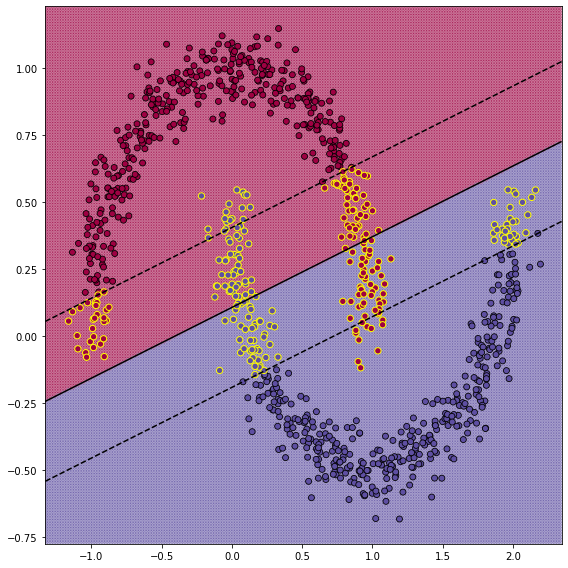

In [5]:
X, y = generate_dataset(True)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

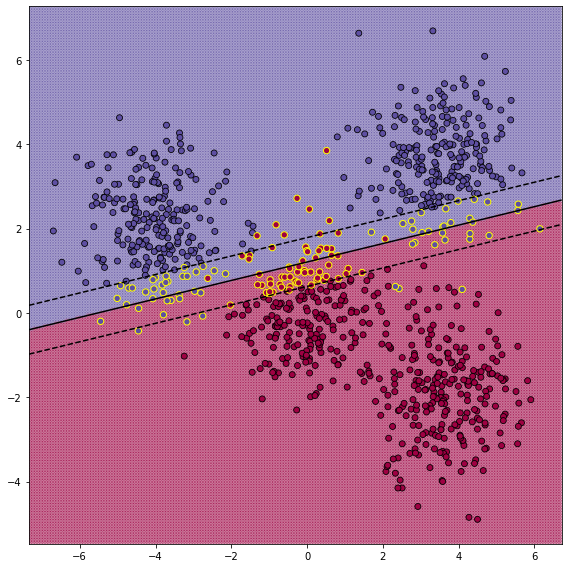

In [6]:
X, y = generate_dataset(False)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 2 (2 балла)
Перед реализацией ядерного SVM, реализуем функции, которые строят ядра.

#### Описание
`get_polynomial_kernel(power)` - возвращает полиномиальное ядро с заданной константой и степенью

`get_gaussian_kernel(sigma=1.)` - возвращает ядро Гаусса с заданным коэффицинтом сигма

In [7]:
def get_polynomial_kernel(c=1, power=2):
    "Возвращает полиномиальное ядро с заданной константой и степенью"
    return lambda u, v: pow((u @ v + c), power)

def get_gaussian_kernel(sigma=1.):
    "Возвращает ядро Гаусса с заданным коэффицинтом сигма"
    def gaussian(u, v):
      if len(u.shape) == 1:
          return np.exp(-sigma * pow(np.linalg.norm(v - u), 2))
      else:
          return np.exp(-sigma * pow(np.linalg.norm(v - u, axis=1), 2))
    return gaussian

### Задание 3 (2 балла)
Теперь перейдем к реализации самого kernel SVM.

#### Описание
`fit(X, y)` - обучает kernel SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Конструктор
`kernel` - ядро-функция

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

Будем решать двойственную задачу. Формулируется она так:

$\begin{cases}\sum \alpha_i - 0.5 \sum \alpha_i \alpha_j y_i y_j K(x_i, x_j) \rightarrow \max_{\alpha}\\ C \geq \alpha \geq 0 \\ y_i \alpha = 0 \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = \alpha \\ P = 
\left[ y_i y_j K(x_i, x_j) \right] \\ 
q = \left[ -1
\right] \\ 
 G = 
\left[
    \begin{array}{c}
      I\\
      \hline
      -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      C \\
      \hline
      0 
    \end{array}
\right] \\
b = 0\\
A = y^\text{T}$

В таком случае решающей функцией будет:

$a(x) = \text{sign} (\sum \alpha_i y_i K(x, x_i) + w_0)$, где $w_0 = \frac{1}{n}\sum\limits_{i=1}^{n}[y_i - \sum \alpha_j y_j K(x_i, x_j)]$

In [8]:
class KernelSVM:
    def __init__(self, C: float, kernel: Callable = get_polynomial_kernel):
        """     
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        kernel : Callable
            Функция ядра.       
        """
        self.C = C
        self.kernel = kernel 
        self.support = None

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:     
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : np.ndarray
            Данные для обучения SVM.
        y : np.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        self.y = y.copy()
        self.X = X.copy()
        self.n = X.shape[0]


        y_ij = np.array([[i * j for i in y] for j in y])
        kernel = lambda i: [self.kernel(X[i], X[j]) for j in range(self.n)]
        x_ij = np.array([kernel(i) for i in range(self.n)])
        P = x_ij * y_ij
        q = -np.ones(self.n)
        G = np.concatenate([np.eye(self.n), -np.eye(self.n)])
        h = np.zeros(self.n * 2)
        h[:self.n] = self.C 
        b = 0.
        A = y.reshape(1, -1,).astype('float64')
        # print(f'P: {P.shape}, q: {q.shape}, G: {G.shape}, h: {h.shape}')


        P = matrix(P)
        q = matrix(q)
        G = matrix(G)
        h = matrix(h)
        b = matrix(b)
        A = matrix(A)
        self.a = np.array(solvers.qp(P=P, q=q, G=G, h=h, A=A, b=b)['x'])


        self.ay = self.a.T * y
        res = lambda i: np.sum([self.ay[0][i] * self.kernel(X[j], X[i]) for j in range(self.n)])
        result = np.array([res(i) for i in range(self.n)])
        self.w0 = np.mean(y - result)


        self.support = np.zeros(self.n) + self.w0
        for i in range(self.n):
            self.support += self.ay[0][i] * self.kernel(X, X[i])
        self.support = y * self.support
        mask = self.support <= 1
        a = np.arange(len(mask))
        self.support = a[mask]


    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        np.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).            
        """

        func = np.zeros(X.shape[0]) + self.w0
        for i in range(self.n):
          func += self.ay[0][i] * self.kernel(X, self.X[i])
        return func

    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        np.ndarray
            Метка класса для каждого элемента X.   
        
        """
        return np.sign(self.decision_function(X))

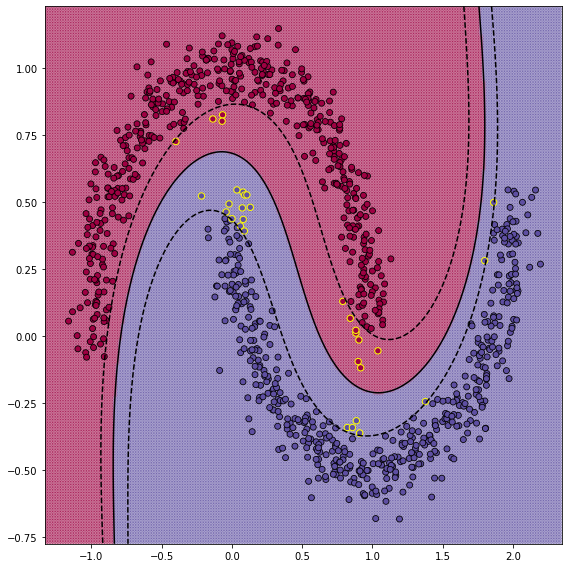

In [9]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

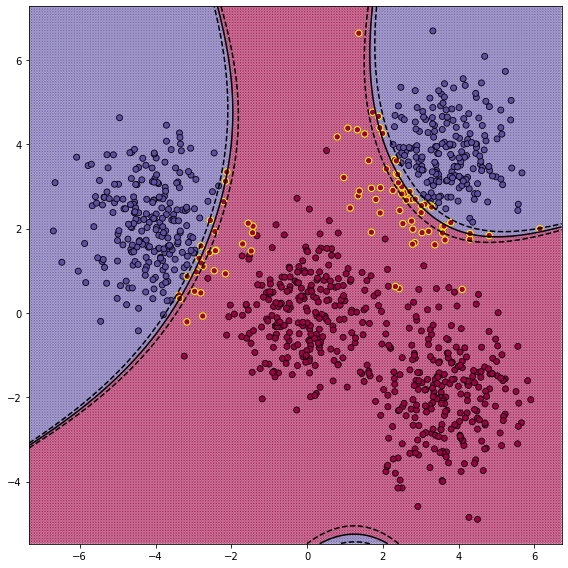

In [10]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

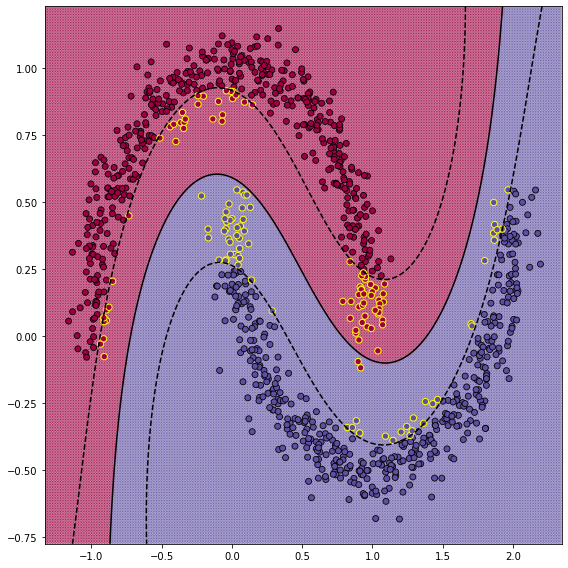

In [51]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

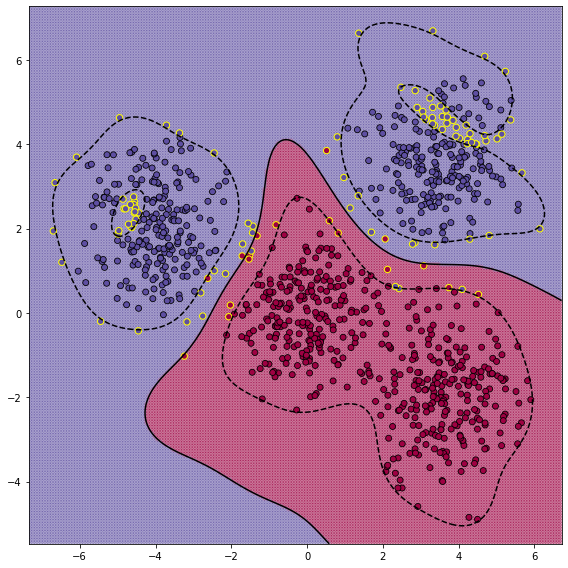

In [53]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 4 (3 балла)
Исследуйте и опишите влияние параметров каждого вида ядра на полученный классификатор. Что происходит при увеличении константы в полиномиальном ядре? При увеличении степени? Как влияет на результат сигма в ядре Гаусса?

__При выполнении этого задания стоит написать код, который визуализирует классификаторы с различными ядрами__

In [30]:
def visualize_(clf, X, y, title):

    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200
    
    cm = plt.cm.Spectral

    xx, yy = np.meshgrid(np.arange(x_min - x_border, x_max + x_border, x_h), np.arange(y_min - y_border, y_max + y_border, y_h))
    mesh = np.c_[xx.ravel(), yy.ravel()]

    fig, axs = plt.subplots(2, 2, figsize=(15,15))
    z_class0 = clf[0].predict(mesh).reshape(xx.shape)
    z_class1 = clf[1].predict(mesh).reshape(xx.shape)
    z_class2 = clf[2].predict(mesh).reshape(xx.shape)
    z_class3 = clf[3].predict(mesh).reshape(xx.shape)


    # Put the result into a color plot
    # plt.figure(1, figsize=(8, 8))
    axs[0, 0].pcolormesh(xx, yy, z_class0, cmap=cm, alpha=0.3, shading='gouraud')
    axs[0, 1].pcolormesh(xx, yy, z_class1, cmap=cm, alpha=0.3, shading='gouraud')
    axs[1, 0].pcolormesh(xx, yy, z_class2, cmap=cm, alpha=0.3, shading='gouraud')
    axs[1, 1].pcolormesh(xx, yy, z_class3, cmap=cm, alpha=0.3, shading='gouraud')

    # Plot hyperplane and margin
    z_dist0 = clf[0].decision_function(mesh).reshape(xx.shape)
    axs[0, 0].contour(xx, yy, z_dist0, [0.0], colors='black')
    axs[0, 0].contour(xx, yy, z_dist0, [-1.0, 1.0], colors='black', linestyles='dashed')
    axs[0, 0].set_title(title[0])

    z_dist1 = clf[1].decision_function(mesh).reshape(xx.shape)
    axs[0, 1].contour(xx, yy, z_dist1, [0.0], colors='black')
    axs[0, 1].contour(xx, yy, z_dist1, [-1.0, 1.0], colors='black', linestyles='dashed')
    axs[0, 1].set_title(title[1])

    z_dist2 = clf[2].decision_function(mesh).reshape(xx.shape)
    axs[1, 0].contour(xx, yy, z_dist2, [0.0], colors='black')
    axs[1, 0].contour(xx, yy, z_dist2, [-1.0, 1.0], colors='black', linestyles='dashed')
    axs[1, 0].set_title(title[2])


    z_dist3 = clf[3].decision_function(mesh).reshape(xx.shape)
    axs[1, 1].contour(xx, yy, z_dist3, [0.0], colors='black')
    axs[1, 1].contour(xx, yy, z_dist3, [-1.0, 1.0], colors='black', linestyles='dashed')
    axs[1, 1].set_title(title[3])

### Рассмотрим динамику изменения ядра Гауса при изменении параметра sigma:

-----------------------------------------------------Moons-----------------------------------------------------


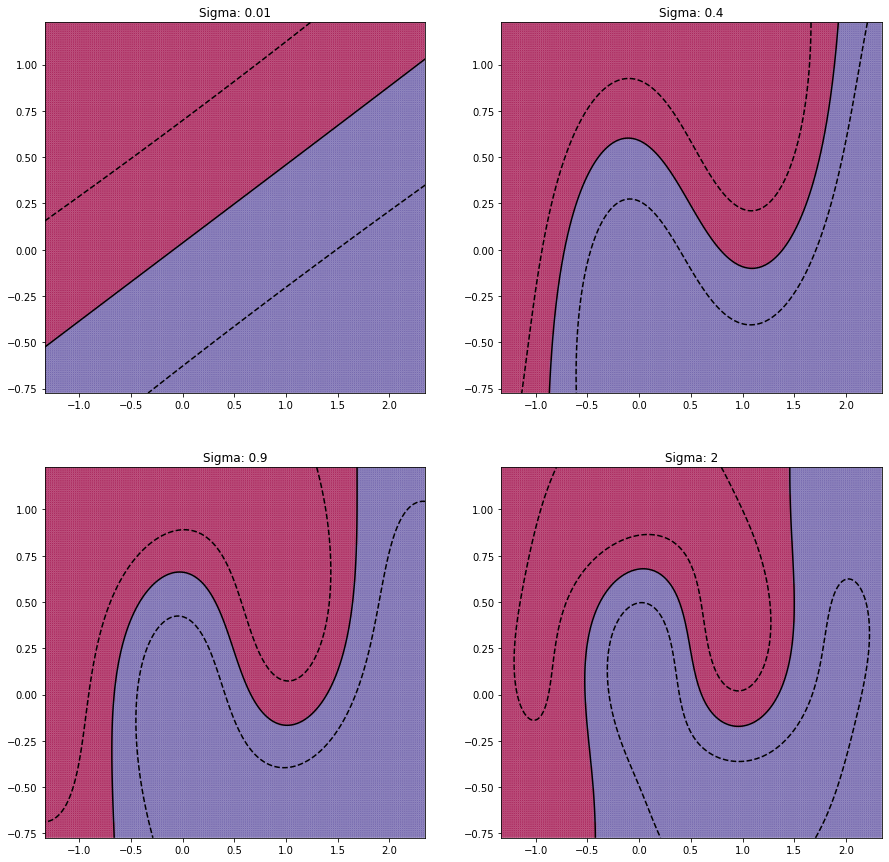

-----------------------------------------------------Blobs-----------------------------------------------------


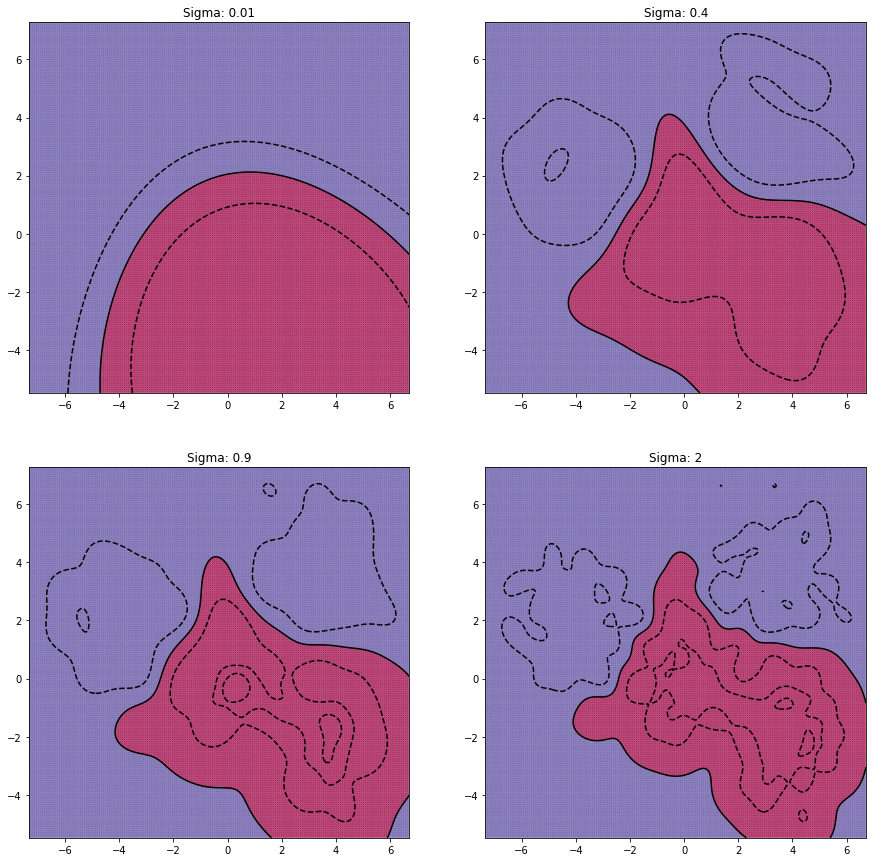

In [31]:
def gauss_test(param, title=None):
    X, y = generate_dataset(param)
    svm1 = KernelSVM(1, kernel=get_gaussian_kernel(0.01))
    svm1.fit(X, y)
    svm2 = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
    svm2.fit(X, y)
    svm3 = KernelSVM(1, kernel=get_gaussian_kernel(0.9))
    svm3.fit(X, y)
    svm4 = KernelSVM(1, kernel=get_gaussian_kernel(2))
    svm4.fit(X, y)
    svm = [svm1, svm2, svm3, svm4]
    visualize_(svm, X, y, title)
    plt.show()
print('-----------------------------------------------------Moons-----------------------------------------------------')
gauss_test(param=True, title=['Sigma: 0.01', 'Sigma: 0.4', 'Sigma: 0.9', 'Sigma: 2'])
print('-----------------------------------------------------Blobs-----------------------------------------------------')
gauss_test(param=False, title=['Sigma: 0.01', 'Sigma: 0.4', 'Sigma: 0.9', 'Sigma: 2'])

Видим, что при значении sigma близком к нулю форма ядра превращается в линию, по мере же роста параметра форма становится сложнее, что свидетельствует о переобучении модели.

### Теперь рассмотрим как меняется полиномиальное ядро в зависимости от 

*   изменения константы:







---------------------------------------------Moons: change conastant----------------------------------------------


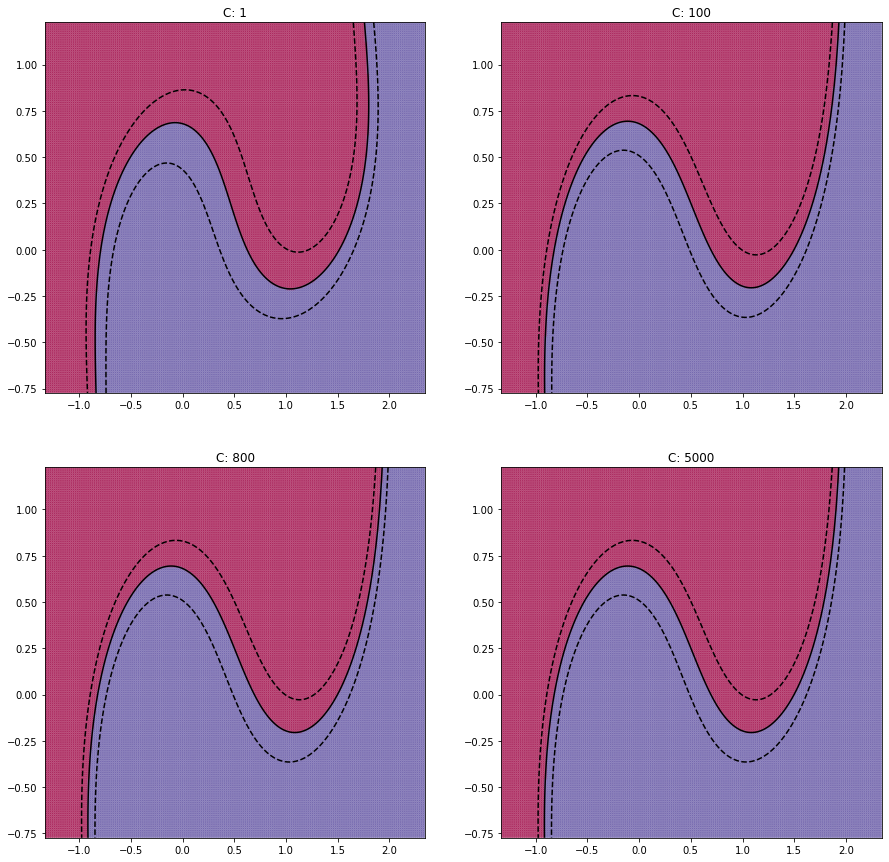

----------------------------------------------Blobs: change constant----------------------------------------------


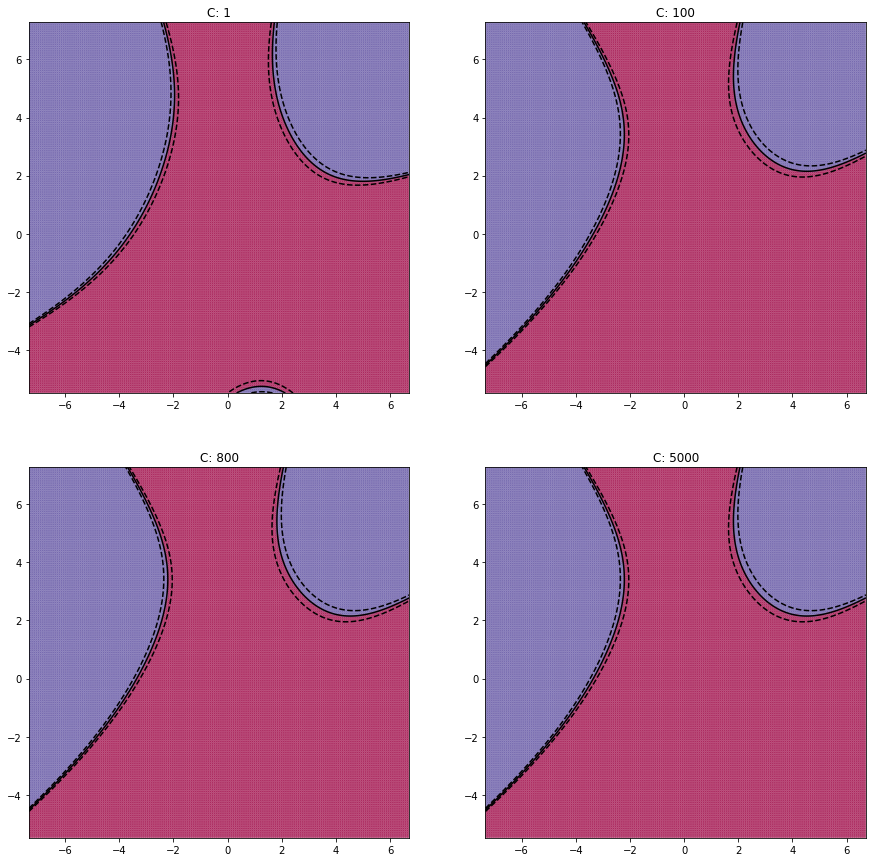

In [32]:
def poly_test(param, title=None):
    X, y = generate_dataset(param)
    svm1 = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
    svm1.fit(X, y)
    svm2 = KernelSVM(1, kernel=get_polynomial_kernel(100, 3))
    svm2.fit(X, y)
    svm3 = KernelSVM(1, kernel=get_polynomial_kernel(800, 3))
    svm3.fit(X, y)
    svm4 = KernelSVM(1, kernel=get_polynomial_kernel(5000, 3))
    svm4.fit(X, y)
    svm = [svm1, svm2, svm3, svm4]
    visualize_(svm, X, y, title)
    plt.show()
print('---------------------------------------------Moons: change conastant----------------------------------------------')
poly_test(param=True, title=['C: 1', 'C: 100', 'C: 800', 'C: 5000'])
print('----------------------------------------------Blobs: change constant----------------------------------------------')
poly_test(param=False, title=['C: 1', 'C: 100', 'C: 800', 'C: 5000'])

На 2-4 графике мы выбрали значения константы >> степени многочлена, но ядро не изменило форму, возможно, это говорит о том, что размер пространства не зависит от константы в том случае если deg < C.



*   изменения степени:



------------------------------------------------Moons: change degree------------------------------------------------


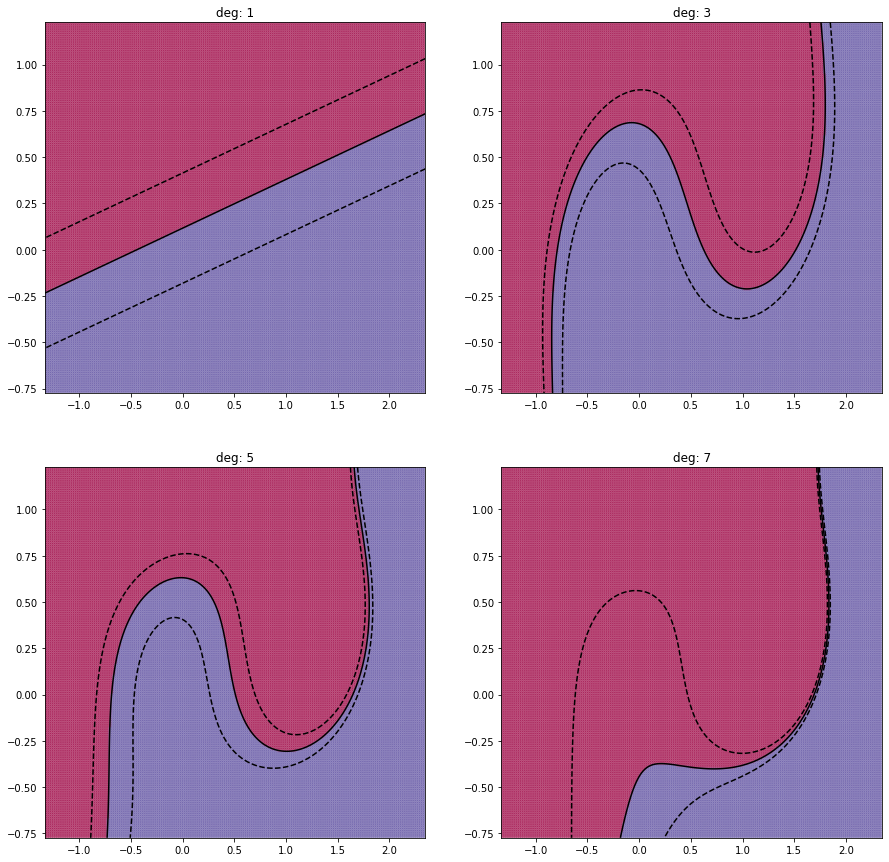

------------------------------------------------Blobs: change degree------------------------------------------------


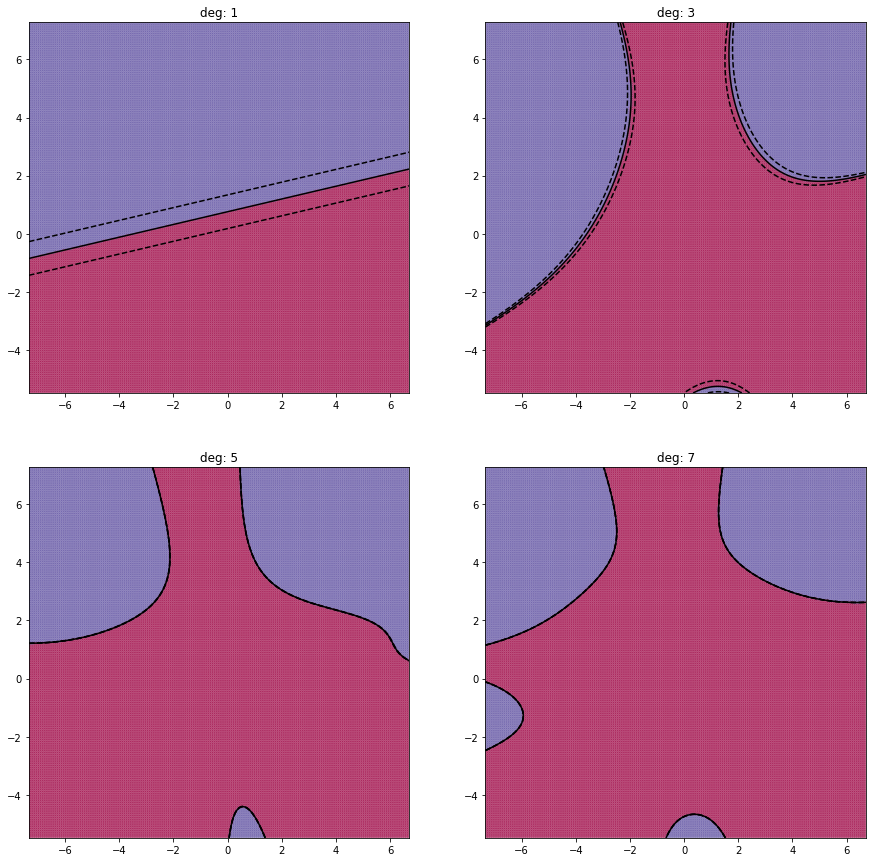

In [38]:
def poly_test_(param, title=None):
    X, y = generate_dataset(param)
    svm1 = KernelSVM(1, kernel=get_polynomial_kernel(1, 1))
    svm1.fit(X, y)
    svm2 = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
    svm2.fit(X, y)
    svm3 = KernelSVM(1, kernel=get_polynomial_kernel(1, 5))
    svm3.fit(X, y)
    svm4 = KernelSVM(1, kernel=get_polynomial_kernel(1, 7))
    svm4.fit(X, y)
    svm = [svm1, svm2, svm3, svm4]
    visualize_(svm, X, y, title)
    plt.show()
print('------------------------------------------------Moons: change degree------------------------------------------------')
poly_test_(param=True, title=['deg: 1', 'deg: 3', 'deg: 5', 'deg: 7'])
print('------------------------------------------------Blobs: change degree------------------------------------------------')
poly_test_(param=False, title=['deg: 1', 'deg: 3', 'deg: 5', 'deg: 7'])

При выборе степени=1 получаем линейное разделение, по мере роста степени ядро становится более сложным, форма приобретает больше изгибов, на лунах разделение перестает быть симметричным. 